In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [3]:
#Loading the dataset
diabetes_data = pd.read_csv('diabetes_dataset.csv')

#Print the first 5 rows of the dataframe.
diabetes_data.head()

,Age,Pregnancies,BMI,Glucose,BloodPressure,HbA1c,LDL,HDL,Triglycerides,WaistCircumference,HipCircumference,WHR,FamilyHistory,DietType,Hypertension,MedicationUse,Outcome
0,69,5,28.39,130.1,77.0,5.4,130.4,44.0,50.0,90.5,107.9,0.84,0,0,0,1,0
1,32,1,26.49,116.5,72.0,4.5,87.4,54.2,129.9,113.3,81.4,1.39,0,0,0,0,0
2,89,13,25.34,101.0,82.0,4.9,112.5,56.8,177.6,84.7,107.2,0.79,0,0,0,1,0
3,78,13,29.91,146.0,104.0,5.7,50.7,39.1,117.0,108.9,110.0,0.99,0,0,0,1,1
4,38,8,24.56,103.2,74.0,4.7,102.5,29.1,145.9,84.1,92.8,0.91,0,1,0,0,0


## Basic EDA and statistical analysis


In [5]:
diabetes_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9538 entries, 0 to 9537
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 9538 non-null   int64  
 1   Pregnancies         9538 non-null   int64  
 2   BMI                 9538 non-null   float64
 3   Glucose             9538 non-null   float64
 4   BloodPressure       9538 non-null   float64
 5   HbA1c               9538 non-null   float64
 6   LDL                 9538 non-null   float64
 7   HDL                 9538 non-null   float64
 8   Triglycerides       9538 non-null   float64
 9   WaistCircumference  9538 non-null   float64
 10  HipCircumference    9538 non-null   float64
 11  WHR                 9538 non-null   float64
 12  FamilyHistory       9538 non-null   int64  
 13  DietType            9538 non-null   int64  
 14  Hypertension        9538 non-null   int64  
 15  MedicationUse       9538 non-null   int64  
 16  Outcom

**DataFrame.describe()** method generates descriptive statistics that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values. This method tells us a lot of things about a dataset. One important thing is that the describe() method deals only with numeric values. It doesn't work with any categorical values. So if there are any categorical values in a column the describe() method will ignore it and display summary for the other columns unless parameter include="all" is passed.

Now, let's understand the statistics that are generated by the describe() method:
* count tells us the number of NoN-empty rows in a feature.
* mean tells us the mean value of that feature.
* std tells us the Standard Deviation Value of that feature.
* min tells us the minimum value of that feature.
* 25%, 50%, and 75% are the percentile/quartile of each features. This quartile information helps us to detect Outliers.
* max tells us the maximum value of that feature.

In [7]:
diabetes_data.describe()

,Age,Pregnancies,BMI,Glucose,BloodPressure,HbA1c,LDL,HDL,Triglycerides,WaistCircumference,HipCircumference,WHR,FamilyHistory,DietType,Hypertension,MedicationUse,Outcome
count,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000
mean,53.577584,7.986161,27.052364,106.104183,84.475781,4.650661,100.133456,49.953418,151.147746,93.951678,103.060621,0.917400,0.302474,0.486161,0.001048,0.405012,0.344097
std,20.764651,4.933469,5.927955,21.918590,14.123480,0.476395,29.911910,15.242194,48.951627,15.594468,13.438827,0.140828,0.459354,0.661139,0.032364,0.490920,0.475098
min,18.000000,0.000000,15.000000,50.000000,60.000000,4.000000,-12.000000,-9.200000,50.000000,40.300000,54.800000,0.420000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,36.000000,4.000000,22.870000,91.000000,74.000000,4.300000,80.100000,39.700000,117.200000,83.400000,94.000000,0.820000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,53.000000,8.000000,27.050000,106.000000,84.000000,4.600000,99.900000,50.200000,150.550000,93.800000,103.200000,0.910000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,72.000000,12.000000,31.180000,121.000000,94.000000,5.000000,120.200000,60.200000,185.100000,104.600000,112.100000,1.010000,1.000000,1.000000,0.000000,1.000000,1.000000
max,89.000000,16.000000,49.660000,207.200000,138.000000,6.900000,202.200000,107.800000,345.800000,163.000000,156.600000,1.490000,1.000000,2.000000,1.000000,1.000000,1.000000


In [8]:
diabetes_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,9538.0,53.577584,20.764651,18.00,36.00,53.00,72.00,89.00
Pregnancies,9538.0,7.986161,4.933469,0.00,4.00,8.00,12.00,16.00
BMI,9538.0,27.052364,5.927955,15.00,22.87,27.05,31.18,49.66
Glucose,9538.0,106.104183,21.918590,50.00,91.00,106.00,121.00,207.20
BloodPressure,9538.0,84.475781,14.123480,60.00,74.00,84.00,94.00,138.00
HbA1c,9538.0,4.650661,0.476395,4.00,4.30,4.60,5.00,6.90
LDL,9538.0,100.133456,29.911910,-12.00,80.10,99.90,120.20,202.20
HDL,9538.0,49.953418,15.242194,-9.20,39.70,50.20,60.20,107.80
Triglycerides,9538.0,151.147746,48.951627,50.00,117.20,150.55,185.10,345.80
WaistCircumference,9538.0,93.951678,15.594468,40.30,83.40,93.80,104.60,163.00


#### It is better to replace zeros with nan since after that counting them would be easier and zeros need to be replaced with suitable values

### Aiming to impute nan values for the columns in accordance with their distribution

## Plotting after Nan removal 

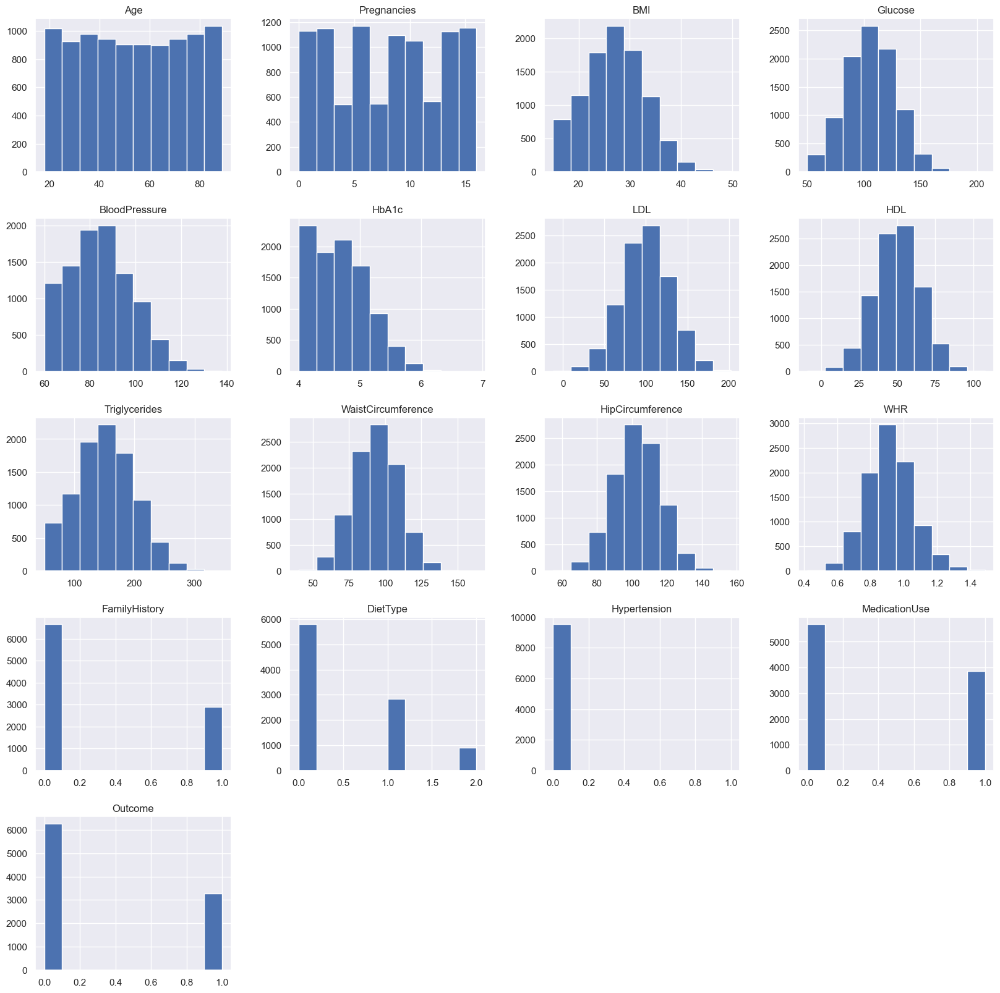

In [12]:
p = diabetes_data.hist(figsize = (20,20))

In [13]:
## observing the shape of the data
diabetes_data.shape

(9538, 17)

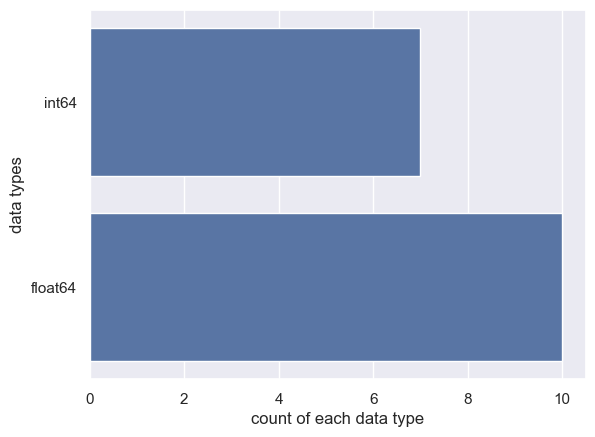

In [14]:
## data type analysis
#plt.figure(figsize=(5,5))
#sns.set(font_scale=2)
sns.countplot(y=diabetes_data.dtypes ,data=diabetes_data)
plt.xlabel("count of each data type")
plt.ylabel("data types")
plt.show()

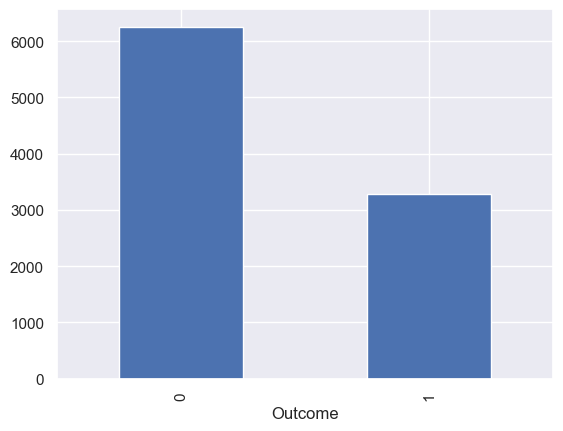

In [15]:
p=diabetes_data.Outcome.value_counts().plot(kind="bar")

#### The above graph shows that the data is biased towards datapoints having outcome value as 0 where it means that diabetes was not present actually. The number of non-diabetics is almost twice the number of diabetic patients

#### Scatter matrix of uncleaned data

#### Pair plot for clean data

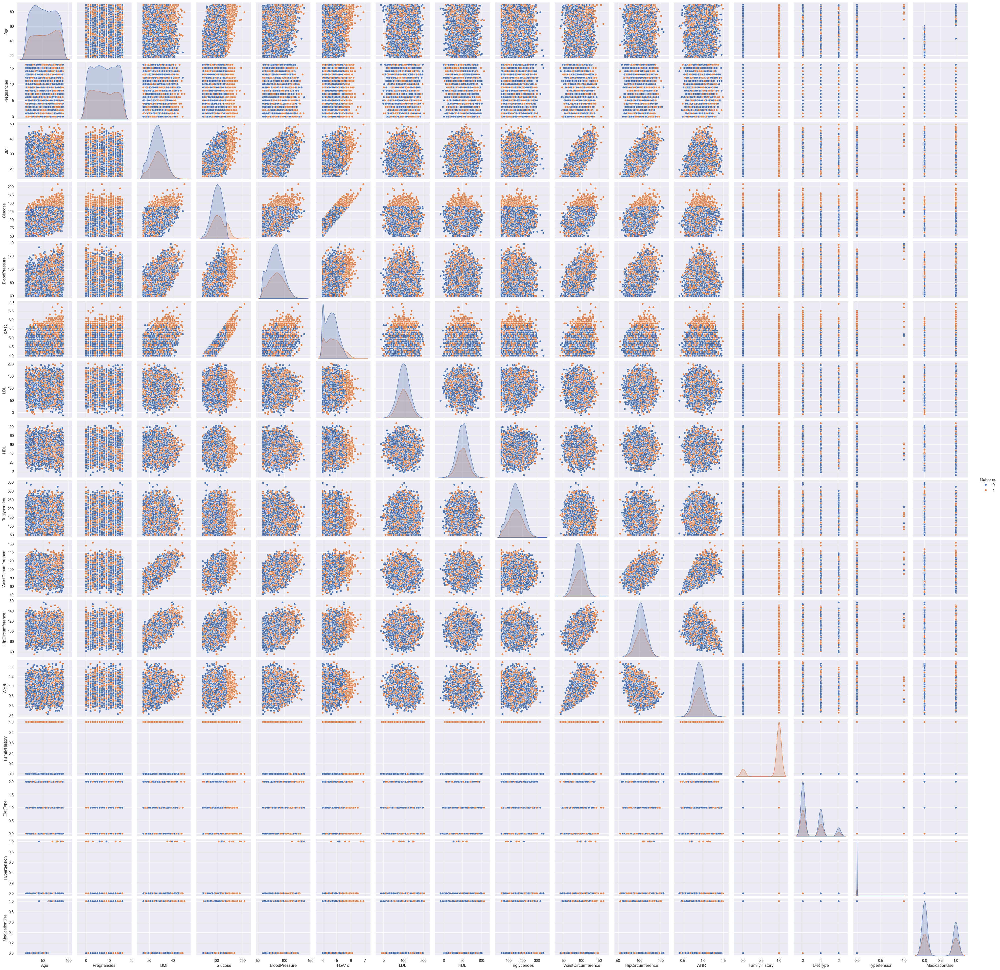

In [19]:
p=sns.pairplot(diabetes_data, hue = 'Outcome')

***Pearson's Correlation Coefficient***: helps you find out the relationship between two quantities. It gives you the measure of the strength of association between two variables. The value of Pearson's Correlation Coefficient can be between -1 to +1. 1 means that they are highly correlated and 0 means no correlation.

A heat map is a two-dimensional representation of information with the help of colors. Heat maps can help the user visualize simple or complex information.

#### Heatmap for clean data

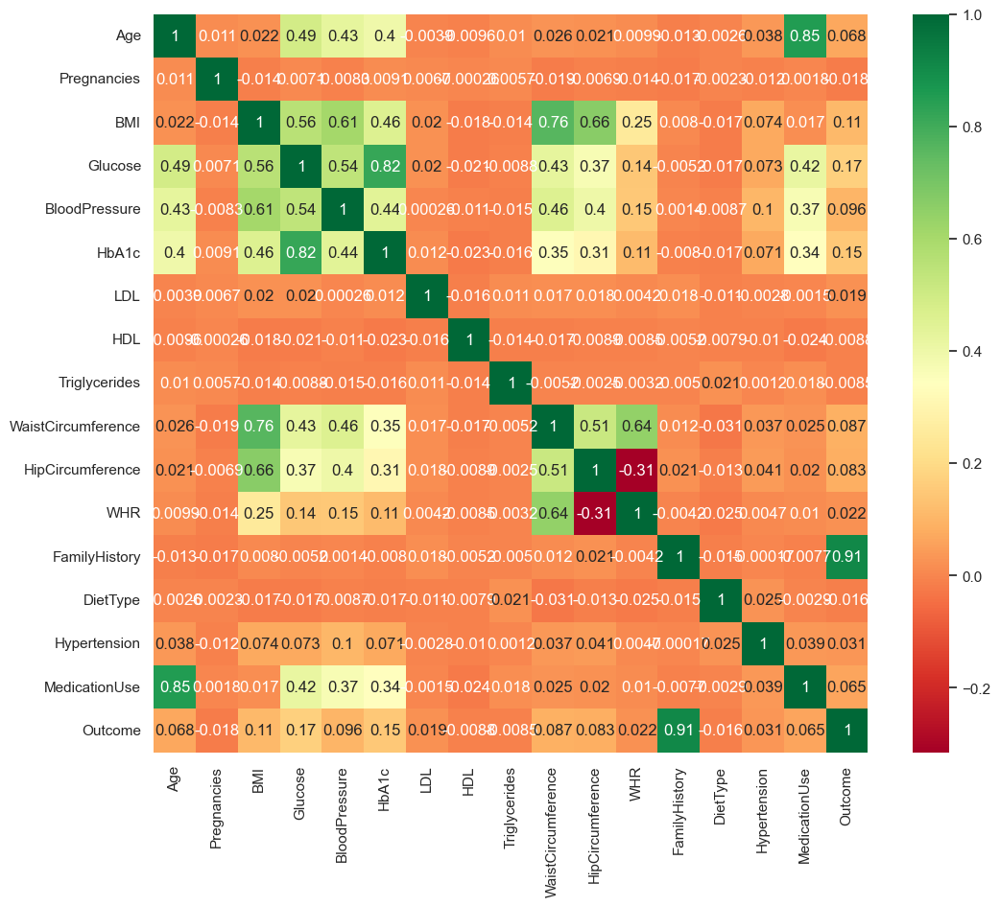

In [22]:
plt.figure(figsize=(12,10))  # on this line I just set the size of figure to 12 by 10.
p=sns.heatmap(diabetes_data.corr(), annot=True,cmap ='RdYlGn')  # seaborn has very simple solution for heatmap

In [88]:
columns = diabetes_data.columns
columns = columns.drop("Outcome")
columns

Index(['Age', 'Pregnancies', 'BMI', 'Glucose', 'BloodPressure', 'HbA1c', 'LDL',
       'HDL', 'Triglycerides', 'WaistCircumference', 'HipCircumference', 'WHR',
       'FamilyHistory', 'DietType', 'Hypertension', 'MedicationUse'],
      dtype='object')

In [42]:
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
X =  pd.DataFrame(sc_X.fit_transform(diabetes_data.drop(["Outcome"],axis = 1),),
        columns=columns)

In [44]:
X.head()

,Age,Pregnancies,BMI,Glucose,BloodPressure,HbA1c,LDL,HDL,Triglycerides,WaistCircumference,HipCircumference,WHR,FamilyHistory,DietType,Hypertension,MedicationUse
0,0.742763,-0.605318,0.225661,1.094828,-0.529344,1.573021,1.011909,-0.390608,-2.066388,-0.221351,0.360123,-0.549634,-0.658513,-0.735376,-0.032397,1.212050
1,-1.039204,-1.416149,-0.094871,0.474317,-0.883383,-0.316268,-0.425721,0.278622,-0.434079,1.240782,-1.611879,3.356042,-0.658513,-0.735376,-0.032397,-0.825048
2,1.705989,1.016344,-0.288878,-0.232882,-0.175305,0.523416,0.413454,0.449210,0.540404,-0.593298,0.308033,-0.904696,-0.658513,-0.735376,-0.032397,1.212050
3,1.176215,1.016344,0.482086,1.820277,1.382467,2.202783,-1.652721,-0.712101,-0.697618,0.958616,0.516395,0.515550,-0.658513,-0.735376,-0.032397,1.212050
4,-0.750237,0.002805,-0.420465,-0.132506,-0.741767,0.103574,0.079121,-1.368209,-0.107208,-0.631775,-0.763546,-0.052548,-0.658513,0.777244,-0.032397,-0.825048


In [46]:
#X = diabetes_data.drop("Outcome",axis = 1)
y = diabetes_data.Outcome

In [48]:
#importing train_test_split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=1/3,random_state=42, stratify=y)

In [58]:
import numpy as np
from sklearn.neighbors import KNeighborsClassifier

# Resetting the c_contiguous flags
X_train = np.ascontiguousarray(X_train)
y_train = np.ascontiguousarray(y_train)
X_test = np.ascontiguousarray(X_test)
y_test = np.ascontiguousarray(y_test)

test_scores = []
train_scores = []

for i in range(1, 15):
    knn = KNeighborsClassifier(i)
    knn.fit(X_train, y_train)
    
    train_scores.append(knn.score(X_train, y_train))
    test_scores.append(knn.score(X_test, y_test))

print('Train scores:', train_scores)
print('Test scores:', test_scores)


Train scores: [1.0, 0.9797106008178672, 0.983957219251337, 0.9759358288770054, 0.9797106008178672, 0.9762503932054105, 0.9787669078326517, 0.9746775715633847, 0.9773513683548286, 0.9743630072349796, 0.9768795218622208, 0.9740484429065744, 0.9754639823843976, 0.9729474677571563]
Test scores: [0.9685534591194969, 0.9654088050314465, 0.970125786163522, 0.9685534591194969, 0.9751572327044025, 0.970754716981132, 0.9748427672955975, 0.9710691823899371, 0.9732704402515723, 0.969811320754717, 0.9726415094339622, 0.970440251572327, 0.970754716981132, 0.9691823899371069]


In [59]:
## score that comes from testing on the same datapoints that were used for training
max_train_score = max(train_scores)
train_scores_ind = [i for i, v in enumerate(train_scores) if v == max_train_score]
print('Max train score {} % and k = {}'.format(max_train_score*100,list(map(lambda x: x+1, train_scores_ind))))

Max train score 100.0 % and k = [1]


In [62]:
## score that comes from testing on the datapoints that were split in the beginning to be used for testing solely
max_test_score = max(test_scores)
test_scores_ind = [i for i, v in enumerate(test_scores) if v == max_test_score]
print('Max test score {} % and k = {}'.format(max_test_score*100,list(map(lambda x: x+1, test_scores_ind))))

Max test score 97.51572327044025 % and k = [5]


## Result Visualisation

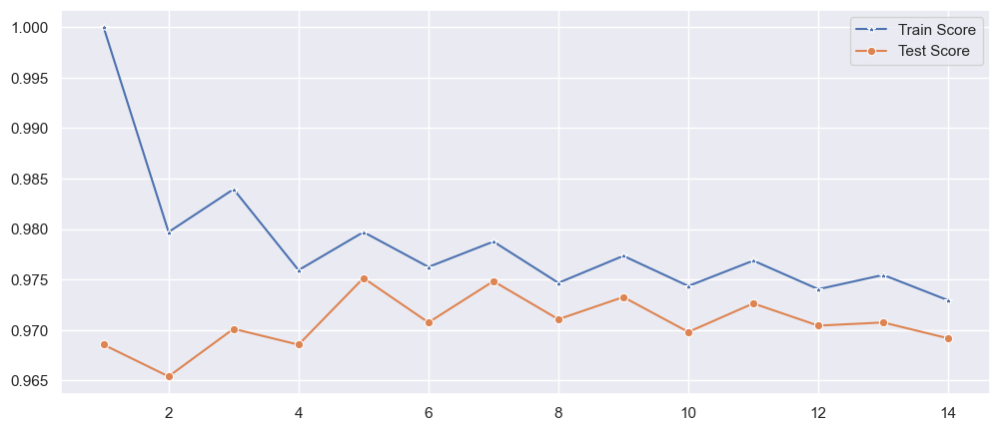

In [65]:
plt.figure(figsize=(12,5))
p = sns.lineplot(x=range(1, 15), y=train_scores, marker='*', label='Train Score')
p = sns.lineplot(x=range(1, 15), y=test_scores, marker='o', label='Test Score')


#### The best result is captured at k = 11 hence 11 is used for the final model

In [68]:
#Setup a knn classifier with k neighbors
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score

# Ensure that the data arrays are in contiguous format
X_train = np.ascontiguousarray(X_train)
y_train = np.ascontiguousarray(y_train)
X_test = np.ascontiguousarray(X_test)
y_test = np.ascontiguousarray(y_test)

# Setup a KNN classifier with 11 neighbors
knn = KNeighborsClassifier(11)

# Fit the model
knn.fit(X_train, y_train)

# Predict on the test set
y_pred = knn.predict(X_test)

# Calculate and print the accuracy score
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy score: {accuracy}')

# Print the KNN score on the test set
knn_test_score = knn.score(X_test, y_test)
print(f'KNN Test score: {knn_test_score}')


Accuracy score: 0.9726415094339622
KNN Test score: 0.9726415094339622


# Model Performance Analysis

In [70]:
#import confusion_matrix
from sklearn.metrics import confusion_matrix,accuracy_score
#let us get the predictions using the classifier we had fit above
y_pred = knn.predict(X_test)
confusion_matrix(y_test,y_pred)
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Predicted,0,1,All
True,,,
0,2085,1,2086
1,86,1008,1094
All,2171,1009,3180


Text(0.5, 20.049999999999997, 'Predicted label')

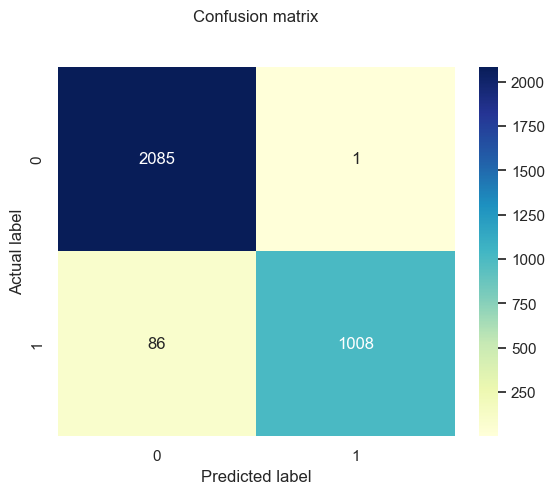

In [72]:
y_pred = knn.predict(X_test)
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
p = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [73]:
#import classification_report
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      2086
           1       1.00      0.92      0.96      1094

    accuracy                           0.97      3180
   macro avg       0.98      0.96      0.97      3180
weighted avg       0.97      0.97      0.97      3180



In [76]:
#decision Tree
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier()
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
print("accuracy Score: ",accuracy_score(y_test,y_pred))
print("confusion_matrix: ")
print(confusion_matrix(y_test,y_pred))

accuracy Score:  1.0
confusion_matrix: 
[[2086    0]
 [   0 1094]]


# Hyper Parameter optimization
Grid search is an approach to hyperparameter tuning that will methodically build and evaluate a model for each combination of algorithm parameters specified in a grid. 

Let’s consider the following example: 

Suppose, a machine learning model X takes hyperparameters a1, a2 and a3. In grid searching, you first define the range of values for each of the hyperparameters a1, a2 and a3. You can think of this as an array of values for each of the hyperparameters. Now the grid search technique will construct many versions of X with all the possible combinations of hyperparameter (a1, a2 and a3) values that you defined in the first place. This range of hyperparameter values is referred to as the grid. 

Suppose, you defined the grid as:
a1 = [0,1,2,3,4,5]
a2 = [10,20,30,40,5,60]
a3 = [105,105,110,115,120,125]

Note that, the array of values of that you are defining for the hyperparameters has to be legitimate in a sense that you cannot supply Floating type values to the array if the hyperparameter only takes Integer values.

Now, grid search will begin its process of constructing several versions of X with the grid that you just defined.

It will start with the combination of [0,10,105], and it will end with [5,60,125]. It will go through all the intermediate combinations between these two which makes grid search computationally very expensive.

In [79]:
#import GridSearchCV
from sklearn.model_selection import GridSearchCV
#In case of classifier like knn the parameter to be tuned is n_neighbors
param_grid = {'n_neighbors':np.arange(1,50)}
knn = KNeighborsClassifier()
knn_cv= GridSearchCV(knn,param_grid,cv=5)
knn_cv.fit(X,y)

print("Best Score:" + str(knn_cv.best_score_))
print("Best Parameters: " + str(knn_cv.best_params_))

Best Score:nan
Best Parameters: {'n_neighbors': 1}


In [80]:
y_pred = knn_cv.predict(X_test)

In [81]:
print("accuracy Score: ",accuracy_score(y_test,y_pred))
print("confusion_matrix: ")
print(confusion_matrix(y_test,y_pred))

accuracy Score:  1.0
confusion_matrix: 
[[2086    0]
 [   0 1094]]


In [86]:
import joblib
joblib.dump(knn_cv,"DBModel.joblib")

['DBModel.joblib']

Name: numpyNote: you may need to restart the kernel to use updated packages.

Version: 1.26.4
Summary: Fundamental package for array computing in Python
Home-page: https://numpy.org
Author: Travis E. Oliphant et al.
Author-email: 
License: Copyright (c) 2005-2023, NumPy Developers.
All rights reserved.

Redistribution and use in source and binary forms, with or without
modification, are permitted provided that the following conditions are
met:

    * Redistributions of source code must retain the above copyright
       notice, this list of conditions and the following disclaimer.

    * Redistributions in binary form must reproduce the above
       copyright notice, this list of conditions and the following
       disclaimer in the documentation and/or other materials provided
       with the distribution.

    * Neither the name of the NumPy Developers nor the names of any
       contributors may be used to endorse or promote products derived
       from this software without specific